# Taller 2

## Métodos Computacionales 2

Instrucciones: Suba el jupyter notebook **.ipynb** en la actividad de bloque neon. El archivo debe ser nombrado ApellidoNombreApellidoNombre_Taller2.ipynb, con el primer Apellido y Nombre de cada integrante de la pareja. **El archivo debe poder correr en el binder del curso o en google colab**

Si un ejercicio demora **más de 10 segundos** en correr se considerará **incorrecto**.

La simulación no debe demorar más de **30 segundos** en compilar y correr.

No modifique el cuaderno, ni los modos de lectura de los archivos.

**Entrega: Jueves 7 de Septiembre 11:59 pm**

## Librerias

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.io import wavfile
from IPython.display import Audio
import matplotlib.animation as ani
plt.style.use('dark_background')

In [2]:
from matplotlib import rc
rc("animation", html = "jshtml")

### Problema 1

Considere el siguiente conjunto de datos que corresponde a la magnitud de un temblor en la escala de Ricther, tomado en un tiempo de 1 día.

Estos datos fueron tomados de "Earthquake harzard Program", https://earthquake.usgs.gov/earthquakes/feed/v1.0/csv.php.

A continuación se realiza un gráfico de la magnitud del temblor en la escala de Ricther.

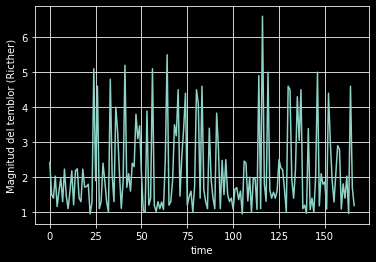

In [3]:
## lectura del archivo del temblor (no modificar)
earth_quake_data = pd.read_csv("https://raw.githubusercontent.com/diegour1/MetodosComputacionales2/main/Datafiles/1.0_day.csv")
magnitude = earth_quake_data["mag"].to_numpy()

plt.plot(np.arange(len(magnitude)), magnitude)
plt.ylabel("Magnitud del temblor (Ricther)")
plt.xlabel("time")
plt.grid()

a) Realice un gráfico del espacio de frecuencias del temblor. Usando **plt.stem()**

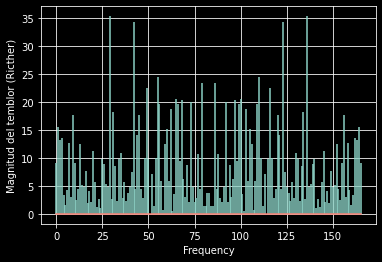

In [4]:
# Su codigo aquí:

"""Implementamos DFT en lugar de FFT porque el tamaño del array de magnitudes es lo suficientemente
   pequeño. Adicionalmente, el tamaño de del array no es una potencia de 2, por lo que el algoritmo de FFT falla si
   no se realiza padding o se realizan otras operaciones vectorizadas que no hemos visto en el curso."""

def DFT(x):
    x = np.array(x)
    
    warning = 'Para calcular DFT de función univaluada esta debe ser un array 1D no vacío'
    assert x.ndim == 1, warning
    
    N = np.size(x)
    X = np.zeros(N, dtype=np.complex64)
    
    for m in range(0, N):    
        for n in range(0, N): 
            X[m] += x[n] * np.exp(-np.pi * 2j * m * n / N)
    return X

Freqs = DFT(magnitude)
Freqs = np.real(Freqs)
Freqs = np.abs(Freqs)
Freqs = np.delete(Freqs, 0) # La frecuencia f = 0 Hz tiene una gran magnitud y sospechamos que es un error
                            # si este fuera el caso la función no tendría periodicidad, por lo cual la eliminamos.      

# Plot
plt.stem(Freqs,markerfmt=' ')
plt.ylabel("Magnitud del temblor (Ricther)")
plt.xlabel("Frequency")
plt.grid()
plt.show()

b) Incluya en el gráfico anterior las 16 frecuencias más importantes del temblor usando **plt.stem()** con otro color. Es decir gráfique las amplitudes de las 16 frecuencias más importantes que describen el temblor de un color y las otras frecuencias de otro color.

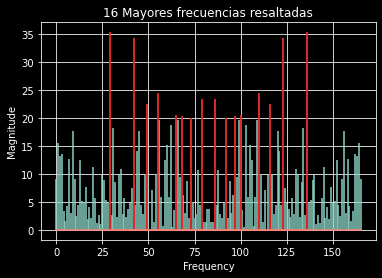

In [5]:
# Su codigo aquí:
n = 16
H_i = np.argsort(np.abs(Freqs))[-n:]

plt.stem(Freqs, markerfmt=' ')
plt.stem(H_i, Freqs[H_i], linefmt='r', markerfmt=' ')

plt.ylabel("Magnitude")
plt.xlabel("Frequency")
plt.title(f"{n} Mayores frecuencias resaltadas")
plt.grid()
plt.show()

c) Reemplace las amplitudes de las 70 frecuencias más altas por cero, y grafique la magnitud del temblor sin estás frecuencias, también incluya el gráfico inicial en su plot.

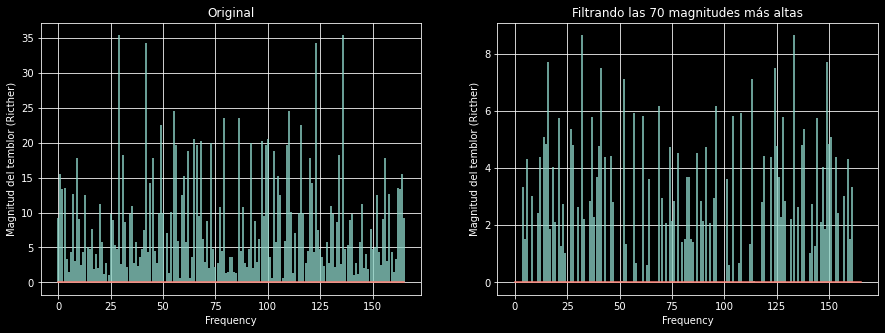

Eliminando las 70 frecuencias más altas, las magnitudes máximas se reducen en 26.693572998046875 en escala Richter.


In [6]:
# Su codigo aquí:

# Sort frequencies by magnitude and set the top 70 to 0
num_zeroed = 70
zero_indices = np.argsort(np.abs(Freqs))[-num_zeroed:]
filteredFreqs = np.copy(Freqs)
filteredFreqs[zero_indices] = 0

# Fig

# Plot original
fig, axs = plt.subplots(1,2, figsize=(15, 5))
axs[0].stem(np.arange(len(Freqs)), np.abs(Freqs), markerfmt=' ')
axs[0].set_ylabel("Magnitud del temblor (Ricther)")
axs[0].set_xlabel("Frequency")
axs[0].set_title("Original")
axs[0].grid()

# Plot con magnitudes filtradas
axs[1].stem(np.arange(len(filteredFreqs)), np.abs(filteredFreqs), markerfmt=' ')
axs[1].set_ylabel("Magnitud del temblor (Ricther)")
axs[1].set_xlabel("Frequency")
axs[1].set_title("Filtrando las 70 magnitudes más altas")
axs[1].grid()

plt.show()
diff = np.max(Freqs)-np.max(filteredFreqs)
print(f"Eliminando las 70 frecuencias más altas, las magnitudes máximas se reducen en {diff} en escala Richter.")

d) Usando la tranformada de Fourier, cálcule e imprima el promedio en escala de Ritcher del temblor

In [7]:
# Su codigo aquí:

print(f"La magnitud media del temblor en función del tiempo es de {np.mean(magnitude)}")
print(f"La media magnitud de frecuencias del temblor es de {np.mean(Freqs)}")

n = 16
H_i = np.argsort(np.abs(Freqs))[-n:]

print(f"\nPero estos valores no son representativos del temblor, al tomar las frecuencias más altas la media de frecuencias de mayor magnitud es de: {np.mean(H_i)}")



La magnitud media del temblor en función del tiempo es de 2.169041916287425
La media magnitud de frecuencias del temblor es de 8.72991943359375

Pero estos valores no son representativos del temblor, al tomar las frecuencias más altas la media de frecuencias de mayor magnitud es de: 82.5


## Problema 2

En el github del curso encontrara un archivo de audio Thriller.wav. \\

Para leer el archivo este jupyter notebook debe estar en el directorio **Datafiles** del github. Es decir no modifique la forma de lectura del archivo.

Escriba un programa que realice los siguientes pasos:

*    Para leer los datos del archivo [Thriller.wav](https://github.com/diegour1/MetodosComputacionales2/blob/main/Datafiles/Thriller.wav). Use el siguiente comando para leer los datos
```
sr, x = wavfile.read("Thriller.wav")
```

Para leer el archivo, su notebook debe estar en la carpeta Datafiles en el github del curso.

In [8]:
# No modifique este codigo asi debe poder leerse su programa
sr, x = wavfile.read("Thriller.wav")
print(x[:, 0].shape)

(631919,)


In [9]:
# ejemplo para escuchar el audio no modificar
Audio(x[:, 0], rate=44100)

a) Realice un gráfico de las amplitudes de las frecuencias haciendo de la transformada de Fourier del audio.

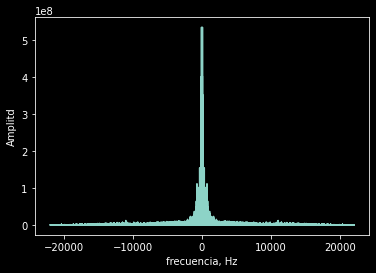

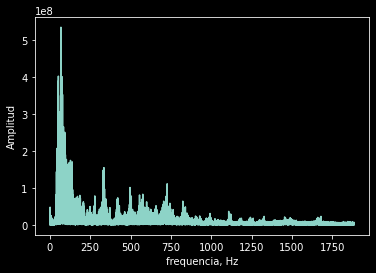

In [10]:
# Su código aquí
señal= x[:, 0]
length_in_s = x.shape[0] / sr
time = np.arange(x.shape[0]) / x.shape[0] * length_in_s
# Usamos fft de numpy porque en este archivo el tamaño de los datos es mucho mayor y DFT excede el tiempo de cómputo permitido.
fft_spectrum = np.fft.fft(señal)
freq = np.fft.fftfreq(señal.size, d=1./sr)
fft_spectrum_abs = np.abs(fft_spectrum)
plt.plot(freq, fft_spectrum_abs)
plt.xlabel("frecuencia, Hz")
plt.ylabel("Amplitd")
plt.show()
plt.plot(freq[:27000], fft_spectrum_abs[:27000])
plt.xlabel("frequencia, Hz")
plt.ylabel("Amplitud")
plt.show()

b) A partir del audio original elimine las 20000 frecuencias más bajas (asignandoles valores iguales a cero) del audio muestre el gráfico y reproduzca el audio.

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


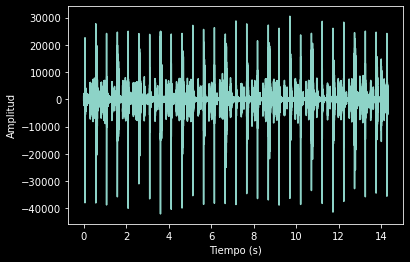

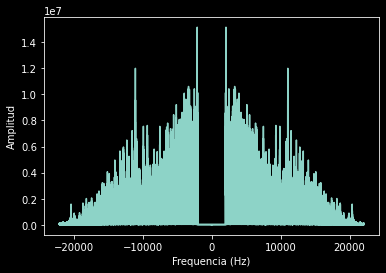

C:\ProgramData\Anaconda3\lib\site-packages\IPython\lib\display.py:159: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


In [11]:
#Filtro por frecuencia
sig_fft_filtered = fft_spectrum.copy()
cut_off = 2000
sig_fft_filtered[np.abs(freq)< cut_off]=0
filtered = np.fft.ifft(sig_fft_filtered)
plt.plot(time, filtered[:])
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.show()
plt.plot(freq, np.abs(sig_fft_filtered))
plt.xlabel('Frequencia (Hz)')
plt.ylabel('Amplitud')
plt.show()
Audio(filtered[:], rate=44100)

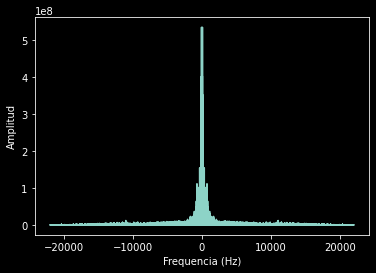

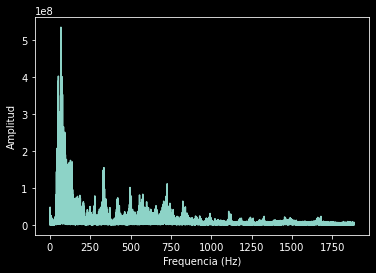

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


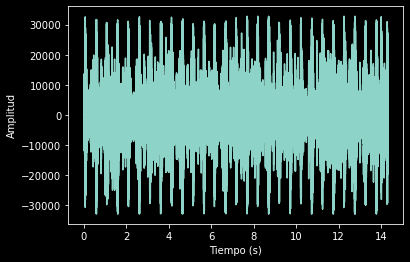

C:\ProgramData\Anaconda3\lib\site-packages\IPython\lib\display.py:159: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


In [12]:
#Filtro de Ruido (Segun la amplitud)
Minimos = pd.Series(fft_spectrum_abs).nsmallest(20000).round(0).astype(float).tolist()
corte= max(Minimos)
filtro1=fft_spectrum.copy()
filtro1[np.abs(filtro1)<corte]=0
plt.plot(freq[0:], np.abs(filtro1)[0:])
plt.xlabel('Frequencia (Hz)')
plt.ylabel('Amplitud')
plt.show()
plt.plot(freq[:27000], np.abs(filtro1[:27000]))
plt.xlabel('Frequencia (Hz)')
plt.ylabel('Amplitud')
plt.show()
filtrado1=np.fft.ifft(filtro1)
plt.plot(time[:], filtrado1[:])
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.show()
Audio(filtrado1, rate=44100)

c) A partir del audio original elimine las frecuencias más altas (las complementarias del 20000 más bajas), muestre el gráfico y reproduzca el audio.

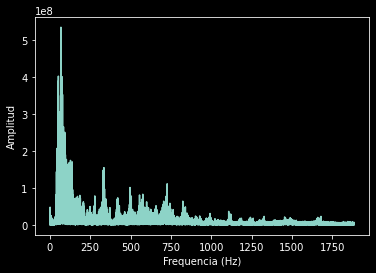

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


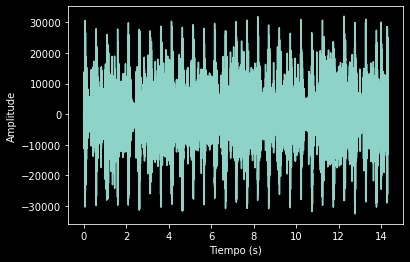

C:\ProgramData\Anaconda3\lib\site-packages\IPython\lib\display.py:159: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


In [13]:
#Filtro por frecuencia
sig_fft_filtered2 = fft_spectrum.copy()
sig_fft_filtered2[np.abs(freq)> cut_off]=0
filtered2 = np.fft.ifft(sig_fft_filtered2)
plt.plot(freq[:27000], np.abs(sig_fft_filtered2)[:27000])
plt.xlabel('Frequencia (Hz)')
plt.ylabel('Amplitud')
plt.show()
plt.plot(time, filtered2[:])
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitude')
plt.show()
Audio(filtered2[:], rate=44100)

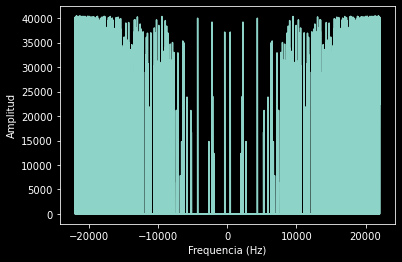

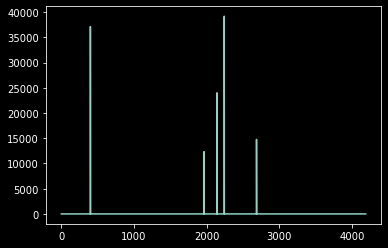

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


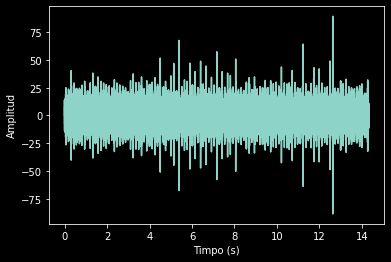

C:\ProgramData\Anaconda3\lib\site-packages\IPython\lib\display.py:159: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


In [14]:
#Filtro (Solo Ruido)
Maximos = pd.Series(fft_spectrum_abs).nlargest(611919).round(0).astype(float).tolist()
corte= min(Maximos)
filtro2=fft_spectrum.copy()
filtro2[np.abs(filtro2)>corte]=0
plt.plot(freq, np.abs(filtro2))
plt.xlabel('Frequencia (Hz)')
plt.ylabel('Amplitud')
plt.show()
plt.plot(freq[:60000], np.abs(filtro2[:60000]))
plt.show()
filtrado2=np.fft.ifft(filtro2)
plt.plot(time[:], filtrado2[:])
plt.xlabel('Timpo (s)')
plt.ylabel('Amplitud')
plt.show()
Audio(filtrado2[:], rate=44100)

d) Diseñe un método usando la transformada de Fourier que reproduzca la canción al revés.

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\ProgramData\Anaconda3\lib\site-packages\IPython\lib\display.py:159: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


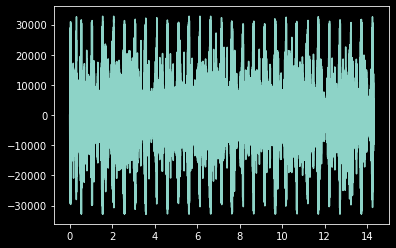

In [15]:
fft_spectrum2 = np.fft.fft(fft_spectrum)
s_new = np.divide(fft_spectrum2[np.arange(fft_spectrum.shape[0])],señal.shape[-1])
plt.plot(time,s_new)
Audio(s_new[:], rate=44100)

## Problema 3

En este problema vamos a considerar el paquete de onda unidimensional Gaussiano, para una particula libre (potencial $0$), el paquete de onda está dado por,

$$
  \psi(x, 0) = \Big[\frac{1}{\pi^{1/4}\sqrt{d}}\Big]\exp{\Big[ikx - \frac{x^2}{2d^2}\Big]}
$$

donde consideramos el tiempo igual a $0$. Para todo el ejercicio tome $ħ = 1$ y $m = 1$.

El paquete de onda se puede interpretar como una función de la posición $x$ tal que $P(x) = \psi(x, 0)\times\psi(x, 0)^*$ corresponde a la densidad de probabilidad de encontrar una particula en la posición $x$, y donde $\psi(x, 0)^*$ es el complejo conjugado de $\psi(x, 0)$.

Considere dos funciones de onda a partir de los archivos, [gauss_wave1.txt](https://raw.githubusercontent.com/diegour1/MetodosComputacionales2/main/Datafiles/gauss_wave1.txt) y [gauss_wave2.txt](https://raw.githubusercontent.com/diegour1/MetodosComputacionales2/main/Datafiles/gauss_wave2.txt).

Los archivos de las dos ondas se pueden leer con el comando,

```
wave1 = pandas.read_csv("https://raw.githubusercontent.com/diegour1/MetodosComputacionales2/main/Datafiles/gauss_wave1.txt")
```

Estos datos indican en la primera columna, la posición en $x$ y en la segunda columna el valor real de la función de onda y en la tercera columna el valor imaginario de la función de onda es decir la 2da y 3ra columna guardan $\psi(x)$. En el codigo a continuación se guarda las posiciones en las variables `x1` y `x2`, y las funciones de onda completas con parte real e imaginaria (número complejo) en` psi_x1` y `psi_x2`.



In [16]:
# codigo para leer los datos no modificar

wave1 = pd.read_csv("https://raw.githubusercontent.com/diegour1/MetodosComputacionales2/main/Datafiles/gauss_wave1.txt", sep=" ").to_numpy()
wave2 = pd.read_csv("https://raw.githubusercontent.com/diegour1/MetodosComputacionales2/main/Datafiles/gauss_wave2.txt", sep=" ").to_numpy()

x1, psi_x1 = wave1[:, 0], wave1[:, 1] + 1j* wave1[:, 2]
x2, psi_x2 = wave2[:, 0], wave2[:, 1] + 1j* wave2[:, 2]

x1.shape, psi_x1.shape, x2.shape, psi_x2.shape

((500,), (500,), (500,), (500,))

a) Gráfique en un mismo gráfico las densidades de probabilidad de las dos funciones, es decir, $x_1 \ \text{vs} \ P_1(x_1)$ y $x_2 \ \text{vs} \ P_2(x_2)$.


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


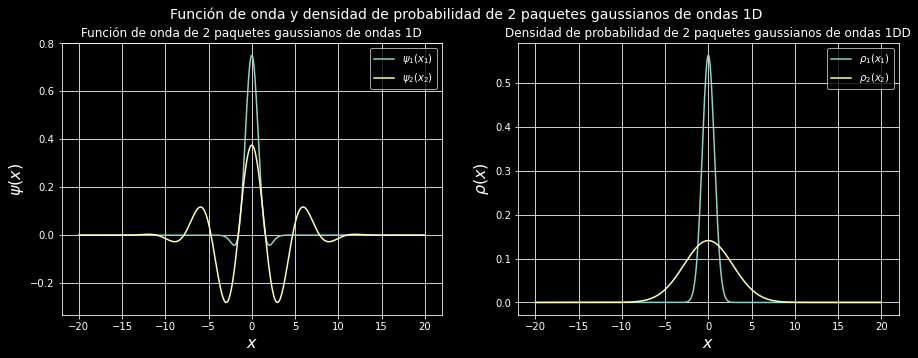

In [17]:
# Su codigo aquí:
fig, axs = plt.subplots(1,2, figsize=(15, 5))
fig.suptitle("Función de onda y densidad de probabilidad de 2 paquetes gaussianos de ondas 1D",fontsize = 14)

for ax in axs:
    ax.set_xlabel(r"$x$",fontsize = 16)

axs[0].plot(x1,psi_x1,label=r'$\psi_{1}(x_{1})$')
axs[0].plot(x2,psi_x2,label=r'$\psi_{2}(x_{2})$')
axs[0].set_ylabel(r"$\psi(x)$",fontsize = 16)
axs[0].grid()
axs[0].legend()
axs[0].set_title("Función de onda de 2 paquetes gaussianos de ondas 1D",fontsize = 12)

# Dado que la densidad de probabilidad es el módulo cuadrado de la función de onda, esta se obtiene multiplicando cada elemento
# de Psi por su conjugado
P1x1 = [C * np.conjugate(C) for C in psi_x1]
P2x2 = [C * np.conjugate(C) for C in psi_x2]

axs[1].plot(x1,np.abs(P1x1),label=r'$\rho_{1}(x_{1})$')
axs[1].plot(x2,np.abs(P2x2),label=r'$\rho_{2}(x_{2})$')
axs[1].set_ylabel(r"$\rho(x)$",fontsize = 16)
axs[1].grid()
axs[1].legend()
axs[1].set_title("Densidad de probabilidad de 2 paquetes gaussianos de ondas 1DD",fontsize = 12)

plt.show()

b) El espacio de momentos $\phi(p)$ es una función tal que $ \ Q(p) = \phi(p)\times\phi(p)* \ $ corresponde a la probabilidad de que el momentum de una particula sea $p$. El espacio de momentos se puede obtener al realizar la transformada de Fourier del espacio de posiciones,

$$
  \phi(p) = \frac{1}{\sqrt{2\piħ}}\int{\psi(x)\exp{(\frac{-ipx}{ħ})\,dx}}
$$

Gráfique en un mismo gráfico las densidades de probabilidad de las dos funciones de momentos, es decir, $p_1 \ \text{vs} \ Q_1(p_1)$ y $p_2 \ \text{vs} \ Q_2(p_2)$ entre $[-20, 20]$ con 500 puntos en $p$.

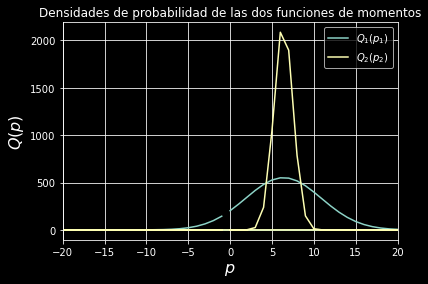

In [18]:
# Su codigo aquí:

# Dado que los datos ya son un array de 500 elementos entre -20 y 20, podemos simplemente aplicar la transformada
# Teniendo en cuenta que la constante de planck debería estar en unidades naturales pero en fft de numpy no lo está,
# Esperamos qun cambio de magnitud, la función requeriría ser normalizada.
Q1p1 = np.fft.fft(psi_x1)
Q2p2 = np.fft.fft(psi_x2)

# No sólo hay que transformar la función, también se debe transformar el espacio x a espacio de momento p, para esto se usa 
# fftfreq, que retorna la transformada del espacio base, en este caso x, por medio de una matriz de los centros de las casillas
# de frecuencia en ciclos por unidad del espaciado de la muestra.
p1 = np.fft.fftfreq(500,1/500)
p2 = np.fft.fftfreq(500,1/500)
# Por ejemplo en el espacio dual tiempo-frecuencia, digamos que la salida de fft es A y la de fftfreq es B, supongamos que A[i]
# es uno de sus componentes, B[i] = k Hz será la frecuencia de su componente principal.

# Nuevamente se aplica el módulo cuadrado, ahora en el espacio de momentos.
Q1p1 = [C * np.conjugate(C) for C in Q1p1]
Q2p2 = [C * np.conjugate(C) for C in Q2p2]


# Plot
plt.plot(p1,np.abs(Q1p1),label=r'$Q_{1}(p_{1})$')
plt.plot(p2,np.abs(Q2p2),label=r'$Q_{2}(p_{2})$')
plt.xlim(-20,20)

plt.title('Densidades de probabilidad de las dos funciones de momentos')
plt.xlabel(r"$p$",fontsize=16)
plt.ylabel(r'$Q(p)$',fontsize=16)
plt.legend()
plt.grid()

plt.show()

c) Imprima los dos escalares que corresponden al valor esperado de los momentos para las dos funciones de onda.

In [56]:
# Su codigo aquí:

# Primero normalizamos la función de onda
"""
import scipy.integrate
def normalize_psi(psi, x):
    int_psi_square = scipy.integrate.simps(abs(psi) ** 2, x)
    return psi/np.sqrt(int_psi_square)"""

Q1p1 = normalize_psi(p1,Q1p1)
Q2p2 = normalize_psi(p2,Q2p2)

# Y ahora obtenemos los valores esperados

print('Momento esperado 1:',np.sum(np.real(p1)*np.abs(Q1p1)))
print('Momento esperado 2:',np.sum(np.real(p2)*np.abs(Q2p2)))

# Esto no funcionó jeje

Momento esperado 1: -113569.86386189424
Momento esperado 2: -113569.94187126867


d) Qué significa físicamente la relación entre el ancho de los gráficos de las partes a y b? (No se califica)

Se relaciona con el Principio de Incertidumbre de Heisenberg, tener una densidad de probabilidad ancha en el espacio supone tener una densidad de probabilidad angosta en espacio de momentos. Esto supone que se conoce con más exactitud el momento de la partícula que su posición, el Principio de Incertidumbre de Heisenberg dice que la partícula no puede tener ninguna variable conjugada completamente conocida (anchura 0) y que al disminuir la anchura de la densidad de probabilidad en un espacio, supone aumentarla en el otro.

e) Realice una simulación mostrando la evolución temporal en el espacio de posiciones de la primera ecuación de onda $\psi_1(x)$ entre $[-20, 20]$.

La simulación debe generarse de forma automatica en el jupyter notebook en el binder del curso, y no debe demorar más de 30 segundos en generarse,

Para ello tome los siguientes parametros $t$ entre $[0, 10]$ con 100 puntos, y la simulación con $100$ frames.

Para asegurarse puede subir un link de youtube de su simulación.

La simulación debería verse parecida al siguiente video.

.

Cambie por su link aquí

https://youtu.be/htkWqg9aG4c

.

.

In [20]:
### su codigo aqui


f) Qué interpretación física puede extraer del ejercicio? (No se califica)

Su texto aqui,

.

.

.

.
